MAIN NOTEBOOK containing the whole pipeline for analysis of brainstems collection

In [ ]:
#import libraries

import sys
sys.path.append('../')

import vtk
import SimpleITK as sitk
import nibabel as nib

from utils import morpho_utils
import random
from utils import visual_utils
from utils.visual_utils import *
from utils.icp_utils import *
from eval.evaluation import *
#from eval.evaluation import point_to_surface_distance
#from utils.morpho_utils import generate_fully_connected_graph

import networkx as nx
import pyFM_local.pyFM.spectral as spectral
from pyFM_local.pyFM.mesh import TriMesh
from pyFM_local.pyFM.FMN import FMN
from tqdm.auto import tqdm

import os
import numpy as np
import matplotlib.pyplot as plt
import scipy
import copy

import networkx as nx
import time

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA

from pyFM_local.pyFM.functional import FunctionalMapping
from pyFM_local.pyFM.refine.zoomout import zoomout_refine
from pyFM_local.pyFM.refine.zoomout import mesh_zoomout_refine_p2p

import scipy
import scipy.spatial
from scipy.io import savemat
from scipy.io import loadmat
from scipy.spatial.transform import Rotation as R

import trimesh
import igl
from igl import point_mesh_squared_distance
import pandas as pd

import plotly.graph_objs as go


Handcrafted functions

In [ ]:

def generate_fully_connected_graph(n, m):
    """
    Create a Graph ensuring full connectivity with n vertices and m edges

    Returns a NetworkX Graph G
    """
    random.seed(42)
    if m < n - 1:
        raise ValueError("Not enough edges to ensure full connectivity.")

    # Step 1: Start with a spanning tree (ensures connectivity)
    G = nx.random_tree(n, seed = 42)

    # Step 2: Add additional random edges until reaching m edges
    existing_edges = set(G.edges())
    all_possible_edges = set((i, j) for i in range(n) for j in range(i+1, n))
    available_edges = list(all_possible_edges - existing_edges)
    
    additional_edges_needed = m - len(existing_edges)
    new_edges = random.sample(available_edges, additional_edges_needed,)
    G.add_edges_from(new_edges)

    return G

def compute_first_pca_vector(vertices):
    """Compute the first principal component (dominant direction) of the mesh vertices."""
    pca = PCA(n_components=3)
    pca.fit(vertices)
    first_pca_vector = pca.components_[0]  # First principal component (dominant direction)
    return first_pca_vector

def compute_minimal_rotation_SIMONE(vec1, vec2):
    """Compute the minimal rotation matrix to align vec1 with vec2 using Rodrigues' rotation formula."""
    vec1 = vec1 / np.linalg.norm(vec1)  # Normalize
    vec1_bis = -vec1
    
    vec2 = vec2 / np.linalg.norm(vec2)  # Normalize

    angle1 = np.arccos(np.clip(np.dot(vec1, vec2), -1.0, 1.0))  # Rotation angle
    angle1_bis = np.arccos(np.clip(np.dot(vec1_bis, vec2), -1.0, 1.0))  # Rotation angle

    if np.cos(angle1) > 0:
        vec = vec1
        angle = angle1
    elif np.cos(angle1_bis):
        vec = vec1_bis
        angle = angle1_bis

    axis = np.cross(vec, vec2)  # Rotation axis (perpendicular to both)
    if np.linalg.norm(axis) < 1e-6:  # If vectors are already aligned, no rotation needed
        return np.eye(3)

    axis = axis / np.linalg.norm(axis)  # Normalize rotation axis
    rotation_matrix = R.from_rotvec(angle * axis).as_matrix()  # Convert to rotation matrix
    return rotation_matrix

def compute_minimal_rotation(vec1, vec2):
    """Compute the minimal rotation matrix to align vec1 with vec2 using Rodrigues' rotation formula."""
    vec1 = vec1 / np.linalg.norm(vec1)  # Normalize
    vec2 = vec2 / np.linalg.norm(vec2)  # Normalize

    axis = np.cross(vec1, vec2)  # Rotation axis (perpendicular to both)
    angle = np.arccos(np.clip(np.dot(vec1, vec2), -1.0, 1.0))  # Rotation angle

    if np.linalg.norm(axis) < 1e-6:  # If vectors are already aligned, no rotation needed
        return np.eye(3)

    axis = axis / np.linalg.norm(axis)  # Normalize rotation axis
    rotation_matrix = R.from_rotvec(angle * axis).as_matrix()  # Convert to rotation matrix
    return rotation_matrix

def align_mesh(mesh1_vert, mesh2_vert):
    """Align mesh1 to mesh2 based on their first PCA component using minimal rotation."""

    pca1 = compute_first_pca_vector(mesh1_vert)
    pca2 = compute_first_pca_vector(mesh2_vert)
    rotation_mat = compute_minimal_rotation_SIMONE(pca1, pca2)

    return rotation_mat

def pick_landmarks(pointcloud, landmarks):

    """
    Visualize a 3D point cloud using Plotly and display point indices on hover.
    Also colors landmarks based on their index in the landmarks array.
    """

    # Extract x, y, z coordinates from the point cloud
    x, y, z = zip(*pointcloud)

    xl, yl, zl = zip(*landmarks)

    # Create a scatter plot for the point cloud
    scatter = go.Scatter3d(
        x=x,
        y=y,
        z=z,
        mode='markers',
        marker=dict(
            size=2,
            color=z,  # Use z-coordinate for color gradient
            colorscale='Viridis',  # Choose a colorscale
            opacity=0.7
        )
    )

    # Color landmarks based on their position in the array
    landmark_colors = list(range(len(landmarks)))

    # Create a scatter plot for landmarks
    landmarks_plot = go.Scatter3d(
        x=xl,
        y=yl,
        z=zl,
        mode='markers',
        marker=dict(
            size=5,
            color=landmark_colors,  # Use index for color mapping
            colorscale='Plasma',    # Use a colorscale for landmarks
            opacity=0.9,
            colorbar=dict(title='Landmark Index')  # Add colorbar for reference
        )
    )

    # Create layout
    layout = go.Layout(scene=dict(aspectmode="data"))

    # Create figure
    fig = go.Figure(data=[scatter, landmarks_plot], layout=layout)

    # Add hover info with point indices
    hover_text = [f'Index: {index}' for index in range(len(pointcloud))]
    fig.data[0]['text'] = hover_text

    # Show the interactive plot
    fig.show()

import trimesh

def align_extract_fps(mesh1, N_landmarks):
    mesh = trimesh.Trimesh(mesh1.vertices, mesh1.faces, process=False)
    ray_origin = np.array([0, 0, 0])  # Starting point of the ray
    ray_direction = compute_first_pca_vector(mesh1.vertices) # Direction of the ray (normalized)
    ray_direction = ray_direction / np.linalg.norm(ray_direction)  # Normalize direction

    locations, index_ray, index_tri = mesh.ray.intersects_location(ray_origins=[ray_origin], ray_directions=[ray_direction])

    if len(locations) == 0:
        print("No intersection found.")
    intersec_idx = knn_query(mesh1.vertices, [locations[0]])
    landmarks = mesh1.extract_fps(N_landmarks, random_init = False, geodesic=True, starting_idx=intersec_idx.item(0), verbose=False)
    return landmarks


def absolute_eigenfunction(mesh_list):
    """Sign alignment of the eigenfunctions of two meshes.

    Computes the sign of the eigenfunction contained in the landmark indivduated by the first PC intersected with the Mesh. 
    Then cheks if the eigenvalues have the same sign and, in case, the eigenvalue of the second is changed to match the first.
    """
    mesh_orig = copy.deepcopy(mesh_list[0])
    original_landmark = align_extract_fps(mesh_orig,1)
    orig_eigenfunction = mesh_orig.eigenvectors[original_landmark.item()]
    for mesh in mesh_list[1:]:
        mesh_to_be_aligned = copy.deepcopy(mesh)
        landmark = align_extract_fps(mesh_to_be_aligned,1)
        eigenfunction = mesh_to_be_aligned.eigenvectors[landmark.item()]
        if np.sign(orig_eigenfunction[0]) != np.sign(eigenfunction[0]):
            mesh.eigenvectors = -mesh_to_be_aligned.eigenvectors



## Preprocessing Spettrale

### Import Data

In [ ]:
# Change paths and filenames

import sklearn
import pandas as pd
ex_data=pd.read_excel(r"labels.xlsx")
train,test = sklearn.model_selection.train_test_split(ex_data.Labels, test_size=0.15, train_size=None, random_state=42, shuffle=True, stratify=None)

m_list= []
m_rem_list= []
bm_list= []
subject_list=[]
label_list=[]

meshlist= []
rem_list_tri = []

# dictionary storing functional maps
maps_dict = {}

start_loading_time = time.time()
S4A_path = os.path.abspath(os.path.join(os.getcwd(), ".."))
LOCAL_PATH = os.path.join(S4A_path, "data/")
for name in ex_data["Subject ID"][train.index]:
    #load each shape
    name = name.rstrip()
    
    PATH =  LOCAL_PATH + "remeshing_3000/remeshed/" + name + "_remesh.obj"
    PATH_hr = LOCAL_PATH + "original/" + name + ".obj"
    PATH_bm = LOCAL_PATH + "remeshing_3000/bm/"  + name + "_remesh.mat"
    rem_list_tri.append(TriMesh(PATH, area_normalize=True, center= True).process(k=110, intrinsic=True))
    #rem_list_tri.append(TriMesh(PATH, area_normalize=True, center= True))
    meshlist.append(TriMesh(PATH_hr, area_normalize=True, center= True))
    D = loadmat(PATH_bm)["U"]
    bm_list.append(D)
    
    print("Mesh" , name, "loaded")

end_loading_time = time.time()
print("Time for loading shapes: ", end_loading_time - start_loading_time)

N_meshes = len(rem_list_tri)

Mesh sub001_Joubert loaded
Mesh sub018_Joubert loaded
Mesh SUB0374 loaded
Mesh SUB0376 loaded
Mesh SUB0612 loaded
Mesh SUB0619 loaded
Mesh SUB0430 loaded
Mesh SUB0372 loaded
Mesh SUB0500 loaded
Mesh sub031_Joubert loaded
Mesh SUB0579 loaded
Mesh sub011_Joubert loaded
Mesh SUB0333 loaded
Mesh SUB0483 loaded
Mesh SUB0545 loaded
Mesh sub010_Joubert loaded
Mesh SUB0432 loaded
Mesh sub026_Joubert loaded
Mesh SUB0114 loaded
Mesh SUB0355 loaded
Mesh sub036_Joubert loaded
Mesh SUB0346 loaded
Mesh SUB0370 loaded
Mesh SUB0494 loaded
Mesh SUB0523 loaded
Mesh SUB0421 loaded
Mesh sub012_Joubert loaded
Mesh SUB0808 loaded
Mesh SUB0330 loaded
Mesh sub003_Joubert loaded
Mesh SUB0434 loaded
Mesh SUB0570 loaded
Mesh SUB0538 loaded
Mesh SUB0550 loaded
Mesh SUB0110 loaded
Mesh SUB0109 loaded
Mesh SUB0780 loaded
Mesh sub030_Joubert loaded
Mesh SUB0509 loaded
Mesh SUB0340 loaded
Mesh SUB0111 loaded
Mesh SUB0361 loaded
Mesh SUB0750 loaded
Mesh SUB0348 loaded
Mesh SUB0365 loaded
Mesh sub009_Joubert loaded
Mes

### Graph Building

5151 possible pairs
Number of nodes: 102
Number of edges: 250
Is connected: True
G has 15 3-cycles


[(0, 64), (0, 97), (0, 47), (0, 46), (0, 23), (0, 74), (0, 3), (1, 81), (1, 12), (2, 14), (2, 16), (2, 57), (3, 6), (3, 4), (3, 55), (3, 71), (3, 14), (4, 41), (5, 33), (5, 8), (5, 84), (6, 49), (6, 87), (7, 94), (7, 44), (8, 90), (8, 71), (9, 82), (9, 77), (9, 36), (9, 39), (9, 55), (9, 59), (9, 10), (9, 85), (10, 92), (10, 37), (10, 29), (10, 59), (11, 38), (11, 42), (11, 13), (11, 48), (11, 94), (12, 74), (12, 29), (12, 48), (12, 63), (12, 78), (12, 95), (12, 59), (12, 30), (13, 23), (13, 43), (13, 71), (13, 73), (13, 101), (13, 97), (14, 35), (14, 51), (14, 16), (14, 56), (15, 91), (15, 48), (15, 49), (16, 31), (16, 67), (17, 22), (17, 94), (17, 92), (17, 53), (18, 28), (18, 29), (18, 52), (18, 54), (18, 87), (18, 20), (19, 71), (19, 27), (19, 63), (19, 37), (19, 59), (20, 65), (20, 46), (20, 31), (20, 101), (20, 42), (20, 61), (21, 81), (21, 68), (21, 32), (22, 73), (22, 72), (23, 41), (23, 30), (24, 73), (24, 90), (24, 64), (24, 93), (24, 62), (25, 56), (25, 91), (25, 86), (25, 6

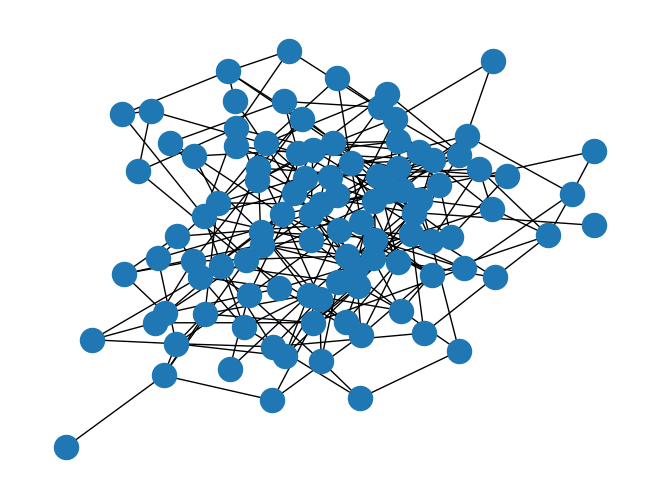

In [4]:
n_chosen_pairs = 250
k_init = 20  
n_subsample = 3000 
print(f'{int(scipy.special.binom(N_meshes, 2)):d} possible pairs')

n = N_meshes  # Nodes
G = generate_fully_connected_graph(n, n_chosen_pairs)

# Verify properties
print(f"Number of nodes: {G.number_of_nodes()}")
print(f"Number of edges: {G.number_of_edges()}")
print(f"Is connected: {nx.is_connected(G)}")
all_cliques = nx.enumerate_all_cliques(G)
triad_cliques = [x for x in all_cliques if len(x) == 3]
print(f'G has {len(triad_cliques)} 3-cycles')
nx.draw(G,)
print(G.edges)

### Aligning Phase

In [5]:
absolute_eigenfunction(rem_list_tri)

### FMN MAPS COMPUTATION

In [6]:
maps_dict = {}
KNN = True
if KNN :
    for pair_ind, (i, j) in enumerate(tqdm(list(G.edges))):
            
        mesh1 = copy.deepcopy(rem_list_tri[i])
        mesh2 = copy.deepcopy(rem_list_tri[j])

        rotatation_mat = align_mesh(mesh1.vertices, mesh2.vertices)
        mesh1.rotate(rotatation_mat)
        
        p2p_12=knn_query(mesh2.vertlist, mesh1.vertlist)

        FM_21 = spectral.mesh_p2p_to_FM(p2p_12, mesh2, mesh1, dims=20)

        p2p_21=knn_query(mesh1.vertlist, mesh2.vertlist)
        
        FM_12 = spectral.mesh_p2p_to_FM(p2p_21, mesh1, mesh2, dims=20)    
        
        maps_dict[(i,j)]=  FM_21.copy()
        maps_dict[(j,i)] = FM_12.copy()
        
    print(f'{len(maps_dict.keys())} maps computed') 
else:
    for pair_ind, (i, j) in enumerate(tqdm(list(G.edges))):
            
        mesh1 = copy.deepcopy(rem_list_tri[i])
        mesh2 = copy.deepcopy(rem_list_tri[j])

        rotatation_mat = align_mesh(mesh1.vertices, mesh2.vertices)
        mesh1.rotate(rotatation_mat)
        #fps1 = mesh1.extract_fps(50, random_init=True, geodesic=True, verbose=False)
        fps1 = align_extract_fps(mesh1, 10)
        fps2 = knn_query(mesh2.vertlist, mesh1.vertlist[fps1])

        landmarks=np.array([fps2,fps1]).T
        
        process_params = {
            'n_ev': (20,20),  # Number of eigenvalues on source and Target
            'landmarks': landmarks,
            'subsample_step': 1,  # In order not to use too many descriptors
            'n_descr': 40, #number of descriptors
            'descr_type': 'WKS',  # WKS or HKS
            }
        
        mesh1 = copy.deepcopy(rem_list_tri[i])
        mesh2 = copy.deepcopy(rem_list_tri[j])
        
        model = FunctionalMapping( mesh2 , mesh1 )
        model.preprocess(**process_params,verbose=False)
        
        # Compute initial functional maps
        
        model.fit(w_descr= 1e-1, w_lap= 1e-3, w_dcomm= 1,w_orient= 0, verbose=False)
        p2p_12=model.get_p2p()
        

        FM_21 = spectral.mesh_p2p_to_FM(p2p_12, mesh2, mesh1, dims=20)


        landmarks=np.array([fps1,fps2]).T
        process_params = {
            'n_ev': (20,20),  # Number of eigenvalues on source and Target
            'landmarks': landmarks,
            'subsample_step': 1,  # In order not to use too many descriptors
            'n_descr': 40, #number of descriptors
            'descr_type': 'WKS',  # WKS or HKS
            }
        
        model = FunctionalMapping( mesh1 , mesh2 )
        model.preprocess(**process_params,verbose=False)

        # Compute initial functional maps
        model.fit(w_descr= 1e-1, w_lap= 1e-3, w_dcomm= 1,w_orient= 0, verbose=False)
        p2p_21=model.get_p2p()
        
        FM_12 = spectral.mesh_p2p_to_FM(p2p_21, mesh1, mesh2, dims=20)    
        
        maps_dict[(i,j)]=  FM_21.copy()
        maps_dict[(j,i)] = FM_12.copy()
        
    print(f'{len(maps_dict.keys())} maps computed')  
    pick_landmarks(mesh1.vertices, mesh1.vertices[landmarks[:,0]])
    pick_landmarks(mesh2.vertices, mesh2.vertices[landmarks[:,1]])
        

  0%|          | 0/250 [00:00<?, ?it/s]

500 maps computed


In [7]:
import plotly.graph_objects as go

def create_colormap(VERT):
    """
    Creates a uniform color map on a mesh

    Args:
        VERT (Nx3 ndarray): The vertices of the object to plot

    Returns:
        Nx3: The RGB colors per point on the mesh
    """
    VERT = np.double(VERT)
    minx = np.min(VERT[:, 0])
    miny = np.min(VERT[:, 1])
    minz = np.min(VERT[:, 2])
    maxx = np.max(VERT[:, 0])
    maxy = np.max(VERT[:, 1])
    maxz = np.max(VERT[:, 2])
    colors = np.stack(
        [
            ((VERT[:, 0] - minx) / (maxx - minx)),
            ((VERT[:, 1] - miny) / (maxy - miny)),
            ((VERT[:, 2] - minz) / (maxz - minz)),
        ]
    ).transpose()
    return colors

def plot_mesh_p2p(vertices, faces, colors=None, title="Mesh"):
    """
    Plots a 3D mesh using Plotly.

    Parameters:
    vertices (torch.Tensor or numpy.ndarray): The vertices of the mesh, shape (N, 3).
    faces (torch.Tensor or numpy.ndarray): The faces of the mesh, shape (M, 3).
    colors (torch.Tensor or numpy.ndarray, optional): The colors for each vertex, shape (N,).
    title (str): The title of the plot.
    """

    x, y, z = vertices[:, 0], vertices[:, 1], vertices[:, 2]
    i, j, k = faces[:, 0], faces[:, 1], faces[:, 2]

    fig = go.Figure(data=[go.Mesh3d(
        x=x, y=y, z=z,
        i=i, j=j, k=k,
        vertexcolor=colors if colors is not None else None,
        opacity=1,
        color='lightblue' if colors is None else None
    )])

    fig.update_layout(title=title)
    fig.show()

In [ ]:
# visualize computed correspondence
color = create_colormap(mesh1.vertices)
plot_mesh_p2p(mesh1.vertices, mesh1.faces, colors=color, title="Mesh 1")

In [9]:
plot_mesh_p2p(mesh2.vertices, mesh2.faces, colors=color[p2p_21], title="Mesh 2")

### NETWORK AND CZO

In [9]:
network = FMN(rem_list_tri[:N_meshes], maps_dict=maps_dict)

Setting 500 edges on 102 nodes.


In [10]:
start = time.time()
if KNN:
    subs=None
else: 
    subsample_list = np.zeros((N_meshes, n_subsample), dtype=int)
    for i in tqdm(range(N_meshes)):
        subsample_list[i] = rem_list_tri[i].extract_fps(n_subsample, geodesic=False, verbose=False)
    subs = subsample_list
steps = 1
czo_parameters = {
    #'nit': (110-k_init)//5,
    'nit': (60-k_init)//steps,
    #'step': 5,
    'step': steps,
    'cclb_ratio': .8,
    'subsample': subs,
    'isometric': False,
    'verbose': True,
    'weight_type': 'icsm',
    'n_jobs': 15,
}

network.zoomout_refine(**czo_parameters)
#network.compute_W(M = 105)
#network.compute_CCLB(int(.8*network.M), verbose=True)
#network.compute_p2p(complete=True)
#end = time.time()
#print("Time for consistent zoom out: ", end - start)
network.compute_W(M = 50)
network.compute_CCLB(int(.8*network.M), verbose=True)
network.compute_p2p(complete=True)
#for edge in network.edges:
#    network.p2p[edge] = spectral.FM_to_p2p(network.maps[edge],rem_list_tri[edge[0]].eigenvectors, rem_list_tri[edge[1]].eigenvectors)

  0%|          | 0/39 [00:00<?, ?it/s]

Computing 50 CLB eigenvectors...
	Done in 1.8s


In [11]:
network.cclb_eigenvalues[:,None][0]=0

TEMPLATE CONSTRUCTION

In [12]:
deviation_from_id_a = np.zeros(network.n_meshes)
deviation_from_id_cr = np.zeros(network.n_meshes)
for i in range(network.n_meshes):
    CSD_a, CSD_c = network.get_CSD(i)
    deviation_from_id_a[i] = np.linalg.norm(CSD_a - np.eye(CSD_a.shape[0]))
    deviation_from_id_cr[i] = np.linalg.norm(np.sqrt(network.cclb_eigenvalues[:,None]) * (CSD_c - np.eye(CSD_c.shape[0]))) / np.sqrt(network.cclb_eigenvalues.sum())

    
deviation_from_id_cr.argmin(), deviation_from_id_cr.argmin()

(40, 40)

In [13]:
base_meshind = deviation_from_id_cr.argmin()
k_displacement = 100
backend = 'gpu' 
for mesh in network.meshlist:
        rotatation_mat = align_mesh(mesh.vertices, network.meshlist[base_meshind].vertices)
        mesh.rotate(rotatation_mat)

In [14]:
p2p_czo_12_list_lr =[]
mesh1 = copy.deepcopy(network.meshlist[base_meshind]) # TriMesh(network.meshlist[base_meshind].path, area_normalize=True).process(k=k_displacement,verbose=True)
LB_1 = network.get_LB(base_meshind, complete=True)  # (n_1',m)

displacements = np.zeros((network.n_meshes, 3*mesh1.n_vertices))
displacements_xyz = np.zeros((network.n_meshes, 3*mesh1.n_vertices))
displacements_red = np.zeros((network.n_meshes, 3*k_displacement))

for meshind2 in tqdm(range(network.n_meshes)):
    if meshind2 == base_meshind:
        p2p_czo_12_list_lr.append(0)
        continue
    
    mesh2 = copy.deepcopy(network.meshlist[meshind2])
    LB_2 = network.get_LB(meshind2, complete=True)  # (n_2',m)
   
    p2p_czo_12 = knn_query(LB_2.astype(np.float32), LB_1.astype(np.float32))

    r_icp, t = rigid_alignment(mesh1.vertlist, mesh2.vertlist, p2p_12=p2p_czo_12,
                                 return_params=True, return_deformed=False, weights=mesh1.vertex_areas)
    
    
    mesh2 = TriMesh(mesh2.vertlist, mesh2.facelist)
    mesh2.translate(-t)
    mesh2.rotate(np.linalg.inv(r_icp))
    
    tau_czo = mesh1.project(mesh2.vertlist[p2p_czo_12] - mesh1.vertlist, k=k_displacement)
    displacements_xyz[meshind2] = (mesh2.vertlist[p2p_czo_12] - mesh1.vertlist).flatten()
    
    displacements[meshind2] = mesh1.decode(tau_czo).flatten()
    displacements_red[meshind2] = tau_czo.flatten()
    p2p_czo_12_list_lr.append(p2p_czo_12)
print('')

  0%|          | 0/102 [00:00<?, ?it/s]

In [ ]:
# Compute average metrics

n = N_meshes-1
sum1=0
sum2=0
chamfer_list = []
psd_list = []
for index in range(network.n_meshes):
    if index == base_meshind:
        continue
    ch = chamfer_distance(network.meshlist[index].vertices[p2p_czo_12_list_lr[index]],mesh1.vertices)
    p2p_vert = network.meshlist[index].vertices[p2p_czo_12_list_lr[index]]
    p2p_faces =network.meshlist[index].faces[p2p_czo_12_list_lr[index]]
    psd = point_to_surface_distance(p2p_vert,p2p_faces, mesh1.vertices, mesh1.faces)
    #print( ch )
    chamfer_list.append( ch )
    psd_list.append( psd )
    sum1 += ch
    sum2 += psd

print(f"Run with {n_chosen_pairs} edges and 3000 vertices LR")
print("Average Chamfer distance: ", sum1/n)
print("Average Point to Surface distance: ", sum2/n)
print(max(chamfer_list))
print(max(psd_list))
max_chanf_shape = np.array(chamfer_list).argmax()
max_psd_shape = np.array(psd_list).argmax()
print("The local index of the max chamfer is: ", max_chanf_shape)
print("The local index of the max psd is: ", max_psd_shape)
print("The index of the max chamfer is: ", train.index[max_chanf_shape])
print("The index of the max psd is: ", train.index[max_psd_shape])
print("The patient with the max chamfer is: " , ex_data["Subject ID"][train.index[max_chanf_shape]])
print("The patient with the max psd is: " , ex_data["Subject ID"][train.index[max_psd_shape]])

Run with 250 edges and 3000 vertices LR
Average Chamfer distance:  0.03064080648368897
Average Point to Surface distance:  0.017794143603222318
0.050520159029073884
0.032551786348153956
The local index of the max chamfer is:  17
The local index of the max psd is:  76
The index of the max chamfer is:  110
The index of the max psd is:  63
The patient with the max chamfer is:  sub026_Joubert
The patient with the max psd is:  SUB0429


In [ ]:
# Mean shape
shape_med = train.index[base_meshind]
print("The index of the mean shape is: ",shape_med)
print("The patient with the mean shape is: ", ex_data["Subject ID"][shape_med])

The index of the mean shape is:  72
The patient with the mean shape is:  SUB0111


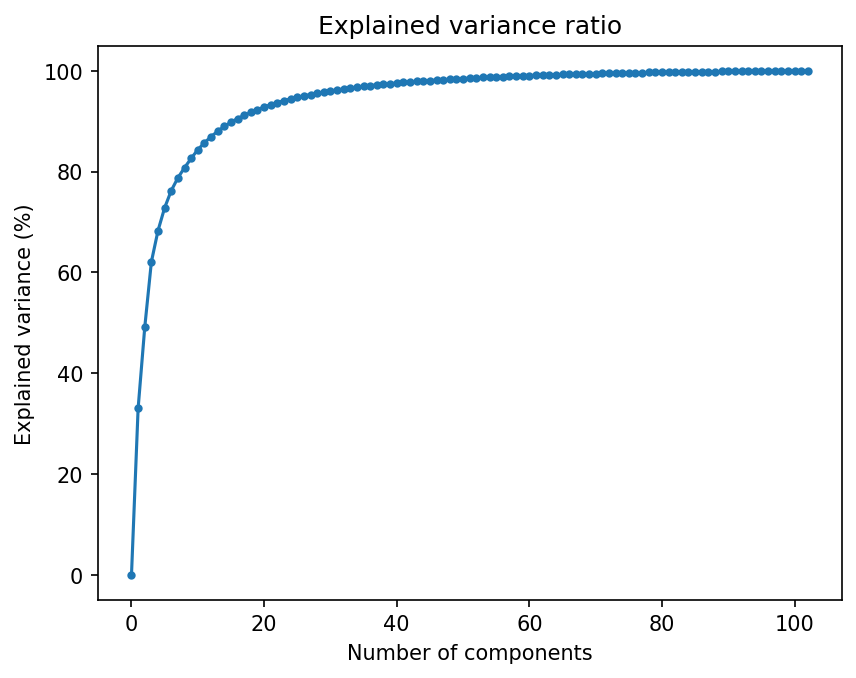

In [17]:
# PCA analysis
avg_disp = np.mean(displacements_red,axis=0)
pca_d = PCA(n_components=N_meshes)
emb_d_red = pca_d.fit_transform(displacements_red - avg_disp[None,:])

plt.figure(dpi=150)
plt.title('Explained variance ratio')
plt.xlabel('Number of components')
plt.ylabel('Explained variance (%)')
plt.plot(np.arange(1+pca_d.n_components) , 100*np.cumsum(np.concatenate([[0],pca_d.explained_variance_ratio_])), marker=".");

In [18]:
for mesh in meshlist:
        rotatation_mat = align_mesh(mesh.vertices, meshlist[base_meshind].vertices)
        mesh.rotate(rotatation_mat)

In [19]:
# Back to HR 

p2p_czo_12_list_hr=[]

mesh1=copy.deepcopy(meshlist[base_meshind])
mesh1.eigenvectors=bm_list[base_meshind]@network.meshlist[base_meshind].eigenvectors

LB_1 = network.get_LB(base_meshind, complete=True)  # (n_1',m)
LB_1_hr=bm_list[base_meshind]@LB_1


displacements_H = np.zeros((network.n_meshes, 3*mesh1.n_vertices))
displacements_red_H = np.zeros((network.n_meshes, 3*k_displacement))
displacements_H_xyz = np.zeros((network.n_meshes, 3*mesh1.n_vertices))

for meshind2 in tqdm(range(network.n_meshes)):
    if meshind2 == base_meshind:
        p2p_czo_12_list_hr.append(0)
        continue
    
    
    mesh2=copy.deepcopy(meshlist[meshind2])
    LB_2 = network.get_LB(meshind2, complete=True)  # (n_1',m)
    LB_2_hr=bm_list[meshind2]@LB_2
    
    p2p_czo_12 = knn_query(LB_2_hr.astype(np.float32), LB_1_hr.astype(np.float32))
    
    r_icp, t = rigid_alignment(mesh1.vertlist, mesh2.vertlist, p2p_12=p2p_czo_12,
                                 return_params=True, return_deformed=False, weights=mesh1.vertex_areas)
    
    mesh2 = TriMesh(mesh2.vertlist, mesh2.facelist)
    mesh2.translate(-t)
    mesh2.rotate(np.linalg.inv(r_icp))

    tau_czo_H = np.linalg.pinv(mesh1.eigenvectors[:,:k_displacement])@(mesh2.vertlist[p2p_czo_12] - mesh1.vertlist)
          
    displacements_H[meshind2] = (mesh1.eigenvectors[:,:k_displacement]@tau_czo_H).flatten()# mesh1.decode(tau_czo).flatten()
    displacements_red_H[meshind2] = tau_czo_H.flatten()
    displacements_H_xyz[meshind2] = (mesh2.vertlist[p2p_czo_12] - mesh1.vertlist).flatten()
    p2p_czo_12_list_hr.append(p2p_czo_12)

  0%|          | 0/102 [00:00<?, ?it/s]

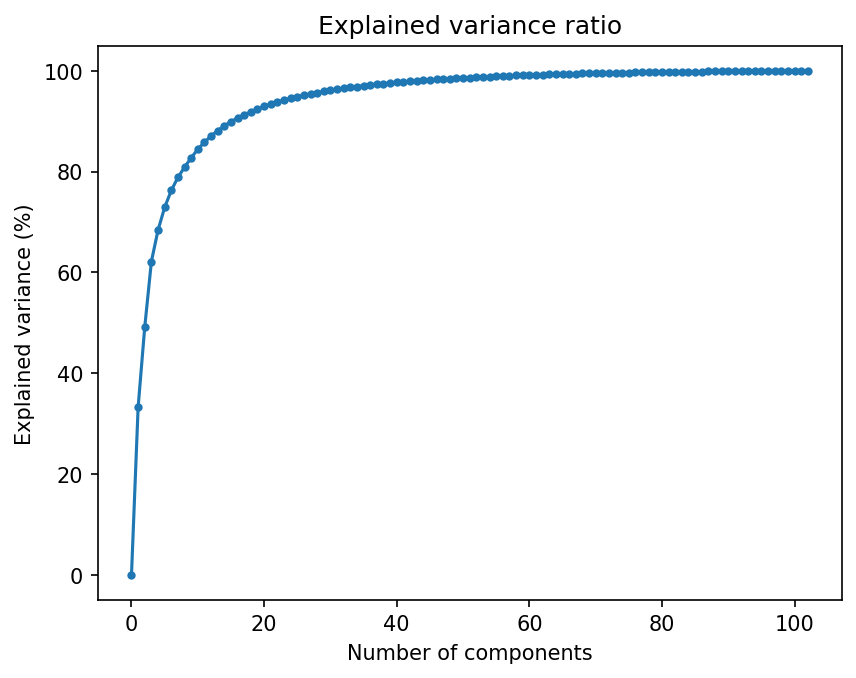

In [20]:
 # PCA on HR 
 
avg_disp = np.mean(displacements_red_H,axis=0)
pca_d = PCA(n_components=N_meshes)
emb_d_red = pca_d.fit_transform(displacements_red_H - avg_disp[None,:])

plt.figure(dpi=150)
plt.title('Explained variance ratio')
plt.xlabel('Number of components')
plt.ylabel('Explained variance (%)')
plt.plot(np.arange(1+pca_d.n_components) , 100*np.cumsum(np.concatenate([[0],pca_d.explained_variance_ratio_])), marker=".");

In [ ]:
"""n = N_meshes-1
sum1=0
sum2=0
chamfer_list = []
psd_list = []
for index in tqdm(range(network.n_meshes)):
    if index == base_meshind:
        continue
    ch = chamfer_distance(meshlist[index].vertices[p2p_czo_12_list_hr[index]],mesh1.vertices)
    p2p_vert = meshlist[index].vertices[p2p_czo_12_list_hr[index]]
    p2p_faces =meshlist[index].faces
    psd = point_to_surface_distance(p2p_vert, p2p_faces, mesh1.vertices, mesh1.faces)
    #print( ch )
    chamfer_list.append( ch )
    psd_list.append( psd )
    sum1 += ch
    sum2 += psd
print(f"Run with {n_chosen_pairs} edges and 3000 vertices HR")
print("Average Chamfer distance: ", sum1/n)
print("Average Point to Surface distance: ", sum2/n)
print(max(chamfer_list))
print(max(psd_list))
max_chanf_shape = np.array(chamfer_list).argmax()
max_psd_shape = np.array(psd_list).argmax()
print(max_chanf_shape)
print(max_psd_shape)
print("The index of the max chamfer is: ", train.index[max_chanf_shape])
print("The index of the max psd is: ", train.index[max_psd_shape])
print("The patient with the max chamfer is: " , ex_data["Subject ID"][train.index[max_chanf_shape]])
print("The patient with the max psd is: " , ex_data["Subject ID"][train.index[max_psd_shape]])"""

In [21]:
# PCA first components visualization

a=(mesh1.eigenvectors[:,:100]@pca_d.components_[0,:].reshape(100,3))
plot_mesh(mesh1,color=((np.einsum('ij,ij->i', a, mesh1.vertex_normals))),colormap='RdBu')
a=(mesh1.eigenvectors[:,:100]@pca_d.components_[1,:].reshape(100,3))
plot_mesh(mesh1,color=((np.einsum('ij,ij->i', a, mesh1.vertex_normals))),colormap='RdBu')
a=(mesh1.eigenvectors[:,:100]@pca_d.components_[2,:].reshape(100,3))
plot_mesh(mesh1,color=((np.einsum('ij,ij->i', a, mesh1.vertex_normals))),colormap='RdBu')
a=(mesh1.eigenvectors[:,:100]@pca_d.components_[3,:].reshape(100,3))
plot_mesh(mesh1,color=((np.einsum('ij,ij->i', a, mesh1.vertex_normals))),colormap='RdBu')
a=(mesh1.eigenvectors[:,:100]@pca_d.components_[4,:].reshape(100,3))
plot_mesh(mesh1,color=((np.einsum('ij,ij->i', a, mesh1.vertex_normals))),colormap='RdBu')
a=(mesh1.eigenvectors[:,:100]@pca_d.components_[5,:].reshape(100,3))
plot_mesh(mesh1,color=((np.einsum('ij,ij->i', a, mesh1.vertex_normals))),colormap='RdBu')

### QUANTITATIVE ANALYSIS FROM PCA

- find representation of shapes along PCA axis
- find extreme deformation
- plot deformations on single shape

In [ ]:
import matplotlib.pyplot as plt
i = 0
j = 1
# Scatter plot of the shapes in the 2D PCA space
colors = ['blue' if label == 0 else 'red' for label in train]
# Scatter plot of the shapes in the 2D PCA space
plt.scatter(emb_d_red[:, i], emb_d_red[:, j], c=colors, alpha=0.7, edgecolors='k')
plt.xlabel(f"PCA Component {i}")
plt.ylabel(f"PCA Component {j}")
plt.title("Shapes Projected onto PCA Plane")
plt.show()


In [ ]:
import matplotlib.pyplot as plt
i = 2
j = 3
# Scatter plot of the shapes in the 2D PCA space
colors = ['blue' if label == 0 else 'red' for label in train]
# Scatter plot of the shapes in the 2D PCA space
plt.scatter(emb_d_red[:, i], emb_d_red[:, j], c=colors, alpha=0.7, edgecolors='k')
plt.xlabel(f"PCA Component {i}")
plt.ylabel(f"PCA Component {j}")
plt.title("Shapes Projected onto PCA Plane")
plt.show()


In [ ]:
import matplotlib.pyplot as plt
i = 4
j = 5
# Scatter plot of the shapes in the 2D PCA space
colors = ['blue' if label == 0 else 'red' for label in train]
# Scatter plot of the shapes in the 2D PCA space
plt.scatter(emb_d_red[:, i], emb_d_red[:, j], c=colors, alpha=0.7, edgecolors='k')
plt.xlabel(f"PCA Component {i}")
plt.ylabel(f"PCA Component {j}")
plt.title("Shapes Projected onto PCA Plane")
plt.show()


In [ ]:
import matplotlib.pyplot as plt
i = 5
j = 6
# Scatter plot of the shapes in the 2D PCA space
colors = ['blue' if label == 0 else 'red' for label in train]
# Scatter plot of the shapes in the 2D PCA space
plt.scatter(emb_d_red[:, i], emb_d_red[:, j], c=colors, alpha=0.7, edgecolors='k')
plt.xlabel(f"PCA Component {i}")
plt.ylabel(f"PCA Component {j}")
plt.title("Shapes Projected onto PCA Plane")
plt.show()


In [ ]:
import matplotlib.pyplot as plt
i = 3
j = 4
# Scatter plot of the shapes in the 2D PCA space
colors = ['blue' if label == 0 else 'red' for label in train]
# Scatter plot of the shapes in the 2D PCA space
plt.scatter(emb_d_red[:, i], emb_d_red[:, j], c=colors, alpha=0.7, edgecolors='k')
plt.xlabel(f"PCA Component {i}")
plt.ylabel(f"PCA Component {j}")
plt.title("Shapes Projected onto PCA Plane")
plt.show()


In [ ]:
import matplotlib.pyplot as plt
i = 5
j = 6
# Scatter plot of the shapes in the 2D PCA space
colors = ['blue' if label == 0 else 'red' for label in train]
# Scatter plot of the shapes in the 2D PCA space
plt.scatter(emb_d_red[:, i], emb_d_red[:, j], c=colors, alpha=0.7, edgecolors='k')
plt.xlabel(f"PCA Component {i}")
plt.ylabel(f"PCA Component {j}")
plt.title("Shapes Projected onto PCA Plane")
plt.show()


In [ ]:
import matplotlib.pyplot as plt
i = 3
j = 4
# Scatter plot of the shapes in the 2D PCA space
colors = ['lightblue' if label == 0 else 'pink' for label in ex_data["gender(0:M; 1:F)"][train.index]]
# Scatter plot of the shapes in the 2D PCA space
plt.scatter(emb_d_red[:, i], emb_d_red[:, j], c=colors, alpha=0.7, edgecolors='k')
plt.legend(['Male (0)', 'Female (1)'], handles=[plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='lightblue', markersize=10),
                                                 plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='pink', markersize=10)],
           title="Gender")
plt.xlabel(f"PCA Component {i}")
plt.ylabel(f"PCA Component {j}")
plt.title("Shapes Projected onto PCA Plane")
plt.show()


In [ ]:
import matplotlib.pyplot as plt
i = 3
j = 1
# Scatter plot of the shapes in the 2D PCA space
colors = ['blue' if label == 0 else 'red' for label in train]
# Scatter plot of the shapes in the 2D PCA space
plt.scatter(emb_d_red[:, i], ex_data["age [years]"][train.index], c=colors, alpha=0.7, edgecolors='k')
plt.legend(['Control (0)', 'Joubert (1)'], handles=[plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=10),
                                                 plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10)],
           title="Patients")
plt.xlabel(f"PCA Component {i}")
plt.ylabel("Age")
plt.title("Shapes Projected onto PCA Plane")
plt.show()


In [ ]:
import matplotlib.pyplot as plt
i = 2
j = 3
# Scatter plot of the shapes in the 2D PCA space
colors = ['lightblue' if label == 0 else 'pink' for label in ex_data["gender(0:M; 1:F)"][train.index]]
# Scatter plot of the shapes in the 2D PCA space
plt.scatter(emb_d_red[:, i], emb_d_red[:, j], c=colors, alpha=0.7, edgecolors='k')
plt.xlabel(f"PCA Component {i}")
plt.ylabel(f"PCA Component {j}")
plt.title("Shapes Projected onto PCA Plane")
plt.show()


### TEST SET

In [ ]:
test_m_list= []
test_m_rem_list= []
test_bm_list= []
test_subject_list=[]
test_label_list=[]

test_meshlist= []
test_rem_list_tri = []

# dictionary storing functional maps
test_maps_dict = {}

start_loading_time = time.time()
LOCAL_PATH = "D:/Joubert/S4A-Brainstem/S4A-Brainstem/data/"
for name in ex_data["Subject ID"][test.index]:
    #load each shape
    name = name.rstrip() 
    
    PATH =  LOCAL_PATH + "remeshing_3000/remeshed/" + name + "_remesh.obj"
    PATH_hr = LOCAL_PATH + "original/" + name + ".obj"
    PATH_bm = LOCAL_PATH + "bm/"  + name + "_remesh.mat"
    test_rem_list_tri.append(TriMesh(PATH, area_normalize=True, center= True).process(k=110, intrinsic=True))
    #rem_list_tri.append(TriMesh(PATH, area_normalize=True, center= True))
    test_meshlist.append(TriMesh(PATH_hr, area_normalize=True, center= True))
    D = loadmat(PATH_bm)["U"]
    test_bm_list.append(D)
    
    print("Mesh" , name, "loaded")

end_loading_time = time.time()
print("Time for loading shapes: ", end_loading_time - start_loading_time)

test_N_meshes = len(test_rem_list_tri)

In [ ]:
template = network.meshlist[base_meshind]

In [ ]:
maps_dict = {}
test_p2p_list_lr =[]
k_displacement = 100
mesh1 = template
displacements_test = np.zeros((len(test_rem_list_tri), 3*mesh1.n_vertices))
displacements_xyz_test = np.zeros((len(test_rem_list_tri), 3*mesh1.n_vertices))
displacements_red_test = np.zeros((len(test_rem_list_tri), 3*k_displacement))

for i, mesh_test in tqdm(enumerate(test_rem_list_tri)):

    rotatation_mat = align_mesh(mesh_test.vertices, template.vertices)
    mesh_test.rotate(rotatation_mat)
    mesh2 = mesh_test
    
    bm1 = copy.deepcopy(bm_list[i])
    bm2 = copy.deepcopy(bm_list[j])

    p2p_12=knn_query(mesh2.vertlist, mesh1.vertlist)

    r_icp, t = rigid_alignment(mesh1.vertlist, mesh2.vertlist, p2p_12=p2p_12, return_params=True, return_deformed=False, weights=mesh1.vertex_areas)
    mesh2 = TriMesh(mesh2.vertlist, mesh2.facelist)
    mesh2.translate(-t)
    mesh2.rotate(np.linalg.inv(r_icp))

    
    #FM_21 = spectral.mesh_p2p_to_FM(p2p_12, mesh2, mesh1, dims=20)

    #p2p_21=knn_query(mesh1.vertlist, mesh2.vertlist)
    #FM_12 = spectral.mesh_p2p_to_FM(p2p_21, mesh1, mesh2, dims=20)    

    tau_czo_test = mesh1.project(mesh2.vertlist[p2p_12] - mesh1.vertlist, k=k_displacement)
    displacements_xyz_test[i] = (mesh2.vertlist[p2p_12] - mesh1.vertlist).flatten()
    
    displacements_test[i] = mesh1.decode(tau_czo_test).flatten()
    displacements_red_test[i] = tau_czo_test.flatten()
    test_p2p_list_lr.append(p2p_12)
    
    #maps_dict[(i,999)]=  FM_21.copy()
    #maps_dict[(999,i)] = FM_12.copy()


In [ ]:
test_emb_pca = pca_d.transform(displacements_red_test)

In [ ]:
i = 2
j = 3
# Scatter plot of the shapes in the 2D PCA space
colors = ['blue' if label == 0 else 'red' for label in train]
colors1 = ['yellow' if label == 0 else 'green' for label in test]
# Scatter plot of the shapes in the 2D PCA space
plt.scatter(emb_d_red[:, i], emb_d_red[:, j], c=colors, alpha=0.7, edgecolors='k')
plt.scatter(test_emb_pca[:, i], test_emb_pca[:, j], c=colors1, alpha=0.7, edgecolors='k')
plt.xlabel(f"PCA Component {i}")
plt.ylabel(f"PCA Component {j}")
plt.title("Shapes Projected onto PCA Plane")
plt.show()

In [ ]:
test_net_list = [meshlist[base_meshind]] + test_rem_list_tri  # Concatenates [1] with my_list
print(len(test_net_list))  # Output: [1, 2, 3, 4]

In [ ]:
network = FMN(test_net_list, maps_dict=maps_dict)

In [ ]:
czo_parameters = {
    'nit': (110-k_init)//5,
    'step': 5,
    'cclb_ratio': .8,
    'subsample': subsample_list,
    'isometric': False,
    'verbose': True,
    'weight_type': 'iscm',
    'n_jobs': 15,
}

network.zoomout_refine(**czo_parameters)

In [ ]:
# Back to HR 

p2p_czo_12_list_hr=[]

mesh1=copy.deepcopy(network.meshlist[0])
mesh1.eigenvectors=bm_list[base_meshind]@network.meshlist[0].eigenvectors 


LB_1 = network.get_LB(0, complete=True)
LB_1_hr=bm_list[base_meshind]@LB_1

displacements_H = np.zeros((network.n_meshes, 3*mesh1.n_vertices))
displacements_red_H = np.zeros((network.n_meshes, 3*k_displacement))
displacements_H_xyz = np.zeros((network.n_meshes, 3*mesh1.n_vertices))

for meshind2 in tqdm(range(network.n_meshes)):
    if meshind2 == 0:
        continue
        
    mesh2=copy.deepcopy(network.meshlist[meshind2])
    LB_2 = network.get_LB(meshind2, complete=True)  # (n_1',m)
    LB_2_hr=test_bm_list[meshind2]@LB_2
    
    p2p_czo_12 = knn_query(LB_2_hr.astype(np.float32), LB_1_hr.astype(np.float32))
    
    R, t = rigid_alignment(mesh1.vertlist, mesh2.vertlist, p2p_12=p2p_czo_12,
                                 return_params=True, return_deformed=False, weights=mesh1.vertex_areas)
    
    mesh2 = TriMesh(mesh2.vertlist, mesh2.facelist)
    mesh2.translate(-t)
    mesh2.rotate(np.linalg.inv(R))

    tau_czo_H = np.linalg.pinv(mesh1.eigenvectors[:,:k_displacement])@(mesh2.vertlist[p2p_czo_12] - mesh1.vertlist)
          
    displacements_H[meshind2] = (mesh1.eigenvectors[:,:k_displacement]@tau_czo_H).flatten()# mesh1.decode(tau_czo).flatten()
    displacements_red_H[meshind2] = tau_czo_H.flatten()
    displacements_H_xyz[meshind2] = (mesh2.vertlist[p2p_czo_12] - mesh1.vertlist).flatten()
    p2p_czo_12_list_hr.append(p2p_czo_12)

In [ ]:
pca_d.transform()

### LINEAR REGRESSION

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA

In [ ]:
X_data = emb_d_red
labels_pd = train

labels = np.asarray(labels_pd)
Y_data = labels


reglin1 = LogisticRegression(penalty='l2', solver='lbfgs', max_iter=1000)

reglin1.fit(emb_d_red, labels)

accuracy = reglin1.score(emb_d_red, labels)
print("Accuracy: ", accuracy)
beta_coeff = reglin1.coef_[0]
odds_ratios = np.exp(beta_coeff)
feature_importance = np.abs(beta_coeff)
sorted_indices = np.argsort(-feature_importance)  # Sort in descending order


In [ ]:
print("\nFeature Ranking (Most Important First):")
for rank, idx in enumerate(sorted_indices):
    print(f"Rank {rank+1}: Feature {idx} (|Beta| = {feature_importance[idx]:.4f})")

plt.figure(figsize=(30, 10))
plt.bar(range(len(beta_coeff)), beta_coeff, color="blue", alpha=0.7)
plt.xlabel("PCA Components")
plt.ylabel("Beta Coefficients")
plt.title("Feature Importance in Logistic Regression")
plt.axhline(0, color='black', linewidth=0.8) 
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn import svm

# Assuming emb_d_red is 2D for plotting; if not, take the first two components
X_data = emb_d_red[:, 2:4]  
Y_data = np.asarray(train)

# Train the SVM classifier with a linear kernel
clf = svm.SVC(kernel='rbf', C=1)
clf.fit(X_data, Y_data)

# Create a mesh grid to plot the decision boundary
h = .001  # step size in the mesh
x_min, x_max = X_data[:, 0].min() - 0.01, X_data[:, 0].max() + 0.01
y_min, y_max = X_data[:, 1].min() - 0.01, X_data[:, 1].max() + 0.01
xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                     np.arange(y_min, y_max, h))

# Predict for each point in the mesh grid
Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Plot the decision boundary and margins
plt.contourf(xx, yy, Z, alpha=0.3)
plt.scatter(X_data[:, 0], X_data[:, 1], c=Y_data, edgecolor='k', s=30)
plt.title("SVM Decision Boundary")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.naive_bayes import GaussianNB

# Assuming emb_d_red is 2D for plotting; if not, take the first two components
X_data = emb_d_red[:, 2:4]  
Y_data = np.asarray(train)

# Train the Naive Bayes classifier
clf = GaussianNB()
clf.fit(X_data, Y_data)

# Create a mesh grid to plot the decision boundary
h = .001  # step size in the mesh
x_min, x_max = -0.04, 0.04
y_min, y_max = -0.04, 0.04
xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                     np.arange(y_min, y_max, h))

# Predict for each point in the mesh grid
Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Plot the decision boundary and margins
plt.contourf(xx, yy, Z, alpha=0.3)
plt.scatter(X_data[:, 0], X_data[:, 1], c=Y_data, edgecolor='k', s=30)
plt.title("Naive Bayes Decision Boundary")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

# Set the limits of the plot
plt.xlim([-0.04, 0.04])
plt.ylim([-0.04, 0.04])

plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier

# Assuming emb_d_red is 2D for plotting; if not, take the first two components
X_data = emb_d_red[:, 2:4]  
Y_data = np.asarray(train)

# Train the Random Forest classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_data, Y_data)

# Create a mesh grid to plot the decision boundary
h = .001  # step size in the mesh
x_min, x_max = -0.04, 0.04
y_min, y_max = -0.04, 0.04
xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                     np.arange(y_min, y_max, h))

# Predict for each point in the mesh grid
Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Plot the decision boundary and margins
plt.contourf(xx, yy, Z, alpha=0.3)
plt.scatter(X_data[:, 0], X_data[:, 1], c=Y_data, edgecolor='k', s=30)
plt.title("Random Forest Decision Boundary")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

# Set the limits of the plot
plt.xlim([-0.04, 0.04])
plt.ylim([-0.04, 0.04])

plt.show()

### Features Selection

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectKBest, chi2, RFE

In [ ]:
model = RandomForestClassifier(random_state=42,class_weight={0: 4, 1: 1})
model.fit(emb_d_red, train)

importances = model.feature_importances_

In [ ]:
plt.figure(figsize=(12, 8))
plt.barh(range(102), importances * 100)
plt.xlabel('Importance (%)')
plt.title('Principal Component Importance using RandomForest')
plt.gca().invert_yaxis()
plt.grid(axis='x', linestyle='--', alpha=0.7)
for i, v in enumerate(importances * 100):
    plt.text(v + 0.5, i, f"{v:.2f}%", va='center')
plt.show()
print("\nPrincipal Component Importance:")


In [ ]:
pred = model.predict(test_emb_pca)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import (accuracy_score, precision_score, recall_score, 
                             f1_score, confusion_matrix, roc_curve, 
                             roc_auc_score, ConfusionMatrixDisplay, classification_report)

def evaluate_classification_model(y_true, y_pred, y_prob=None, class_names=None):
    """
    Evaluates the performance of a classification model using classical metrics.
    
    Parameters:
    - y_true: True labels
    - y_pred: Predicted labels
    - y_prob: Predicted probabilities (optional, required for ROC curve and AUC)
    - class_names: List of class names for confusion matrix display (optional)
    """
    
    # Accuracy
    accuracy = accuracy_score(y_true, y_pred)
    print(f"Accuracy: {accuracy:.4f}")
    
    # Precision, Recall, F1-Score
    print("\nClassification Report:")
    print(classification_report(y_true, y_pred, target_names=class_names))
    
    # Confusion Matrix
    cm = confusion_matrix(y_true, y_pred)
    print("\nConfusion Matrix:")
    print(cm)
    
    # Display Confusion Matrix
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    disp.plot(cmap='Blues')
    plt.title('Confusion Matrix')
    plt.show()
    
    # ROC Curve and AUC (for binary classification)
    if y_prob is not None and len(np.unique(y_true)) == 2:
        fpr, tpr, _ = roc_curve(y_true, y_prob)
        auc_score = roc_auc_score(y_true, y_prob)
        
        plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {auc_score:.4f})')
        plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('ROC Curve')
        plt.legend()
        plt.show()
    elif y_prob is None:
        print("\nROC and AUC not displayed: y_prob is required.")
    else:
        print("\nROC and AUC are only supported for binary classification.")


In [ ]:
evaluate_classification_model(test, pred)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

# Load your PCA features (replace this with your own data loading method)
# Example: Assuming you have a NumPy array called pca_features
# pca_features = np.load('path_to_your_pca_features.npy')

# For demonstration, let's create some random data
np.random.seed(9)
pca_features = emb_d_red  # 100 samples with 10 PCA components

# Optional: Standardize the features (recommended for t-SNE)
scaler = StandardScaler()
pca_features = scaler.fit_transform(pca_features)
colors = ['blue' if label == 0 else 'red' for label in train]

# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42)
tsne_result = tsne.fit_transform(pca_features)

# Plot the t-SNE results
plt.figure(figsize=(10, 7))
plt.scatter(tsne_result[:, 0], tsne_result[:, 1], c=colors, edgecolor='k')
plt.title('t-SNE Visualization of PCA Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.grid(True)
plt.show()


2D-3D integration code to update